In [57]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kde import KDEUnivariate
from pandas import Series, DataFrame
from patsy import dmatrices
from sklearn import datasets, svm
#from KaggleAux import predict as ka
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/titanic/train.csv
/kaggle/input/titanic/gender_submission.csv
/kaggle/input/titanic/test.csv


In [58]:
train_data = pd.read_csv("/kaggle/input/titanic/train.csv")
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [59]:
test_data = pd.read_csv("/kaggle/input/titanic/test.csv")
test_data.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [60]:
train_data=train_data.drop(['Ticket','Cabin'], axis=1)
train_data=train_data.dropna()

In [61]:
fig=plt.figure(figsize=(18,6),dpi=1600)
alpha_scatterplot=0.2
alpha_bar_chart=0.55

ax1=plt.subplot2grid((2,3),(0,0))
train_data.Survived.value_counts().plot(kind='bar', alpha=alpha_bar_chart)

ax1.set_xlim(-1,2)
plt.title("Distribution of Survival, (1 = Survived)")

plt.subplot2grid((2,3),(0,1))
plt.scatter(train_data.Survived, train_data.Age, alpha=alpha_scatterplot)

plt.ylabel("Age")
plt.grid(b=True, which='major', axis='y')
plt.title("Survival by age, (1=Survived)")

ax3=plt.subplot2grid((2,3),(0,2))
train_data.Pclass.value_counts().plot(kind="barh",alpha=alpha_bar_chart)
ax3.set_ylim(-1, len(train_data.Pclass.value_counts()))
plt.title("Class Distribution")

plt.subplot2grid((2,3),(1,0),colspan=2)
train_data.Age[train_data.Pclass==1].plot(kind='kde')
train_data.Age[train_data.Pclass==2].plot(kind='kde')
train_data.Age[train_data.Pclass==3].plot(kind='kde')
plt.xlabel("Age")
plt.title("Age Distribution within classes")
plt.legend(('1st class','2nd class', '3rd class'),loc='best')

ax5= plt.subplot2grid((2,3),(1,2))
train_data.Embarked.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
ax5.set_xlim(-1,len(train_data.Embarked.value_counts()))

plt.title("Passengers per boarding location")

Text(0.5, 1.0, 'Passengers per boarding location')

In [62]:
train_data_male=train_data.Survived[train_data.Sex=='male'].value_counts().sort_index()
train_data_female=train_data.Survived[train_data.Sex=='female'].value_counts().sort_index()

fig=plt.figure(figsize=(18,6),dpi=1600)
ax1= fig.add_subplot(121)
train_data_male.plot(kind='barh', label='Male', alpha=0.55)
train_data_female.plot(kind='barh', color='#FA2379', label= 'Female',alpha=0.55)
plt.title("Who SUrvived? with respect to the Gender, (raw value counts)"); plt.legend(loc='best')
ax1.set_ylim(-1,2)

ax2= fig.add_subplot(122)
(train_data_male/float(train_data_male.sum())).plot(kind='barh', label='Male', alpha=0.55)
(train_data_female/float(train_data_female.sum())).plot(kind='barh', color='#FA2379', label= 'Female',alpha=0.55)
plt.title("Who SUrvived propotionally? with respect to the Gender, (raw value counts)"); plt.legend(loc='best')
ax2.set_ylim(-1,2)




(-1.0, 2.0)

In [63]:
fig= plt.figure(figsize=(18,4), dpi=1600)
alpha_level = 0.65


ax1=fig.add_subplot(141)
female_highclass= train_data.Survived[train_data.Sex == 'female'][train_data.Pclass !=3].value_counts().sort_index()
female_highclass.plot(kind ='bar', label ='female, highclass', color='#FA2479', alpha=alpha_level)
ax1.set_xticklabels([ "Died", "Survived"], rotation=0)
ax1.set_xlim(-1, len(female_highclass))
plt.title("Who Survived? with respect to gender and class")
plt.legend(loc='best')

ax2=fig.add_subplot(142, sharey=ax1)
female_lowclass= train_data.Survived[train_data.Sex == 'female'][train_data.Pclass ==3].value_counts().sort_index()
female_lowclass.plot(kind ='bar', label ='female, lowclass', color='pink', alpha=alpha_level)
ax2.set_xticklabels([ "Died", "Survived"], rotation=0)
ax2.set_xlim(-1, len(female_lowclass))
plt.title("Who Survived? with respect to gender and class")
plt.legend(loc='best')

ax3=fig.add_subplot(143, sharey=ax1)
male_highclass= train_data.Survived[train_data.Sex == 'male'][train_data.Pclass !=3].value_counts().sort_index()
male_highclass.plot(kind ='bar', label ='male, highclass', alpha=alpha_level, color='steelblue')
ax3.set_xticklabels([ "Died", "Survived"], rotation=0)
ax3.set_xlim(-1, len(male_highclass))
plt.title("Who Survived? with respect to gender and class")
plt.legend(loc='best')

ax4=fig.add_subplot(144, sharey=ax1)
male_lowclass= train_data.Survived[train_data.Sex == 'male'][train_data.Pclass ==3].value_counts().sort_index()
male_lowclass.plot(kind ='bar', label ='male, lowclass', color='steelblue', alpha=alpha_level)
ax4.set_xticklabels([ "Died", "Survived"], rotation=0)
ax4.set_xlim(-1, len(male_lowclass))
plt.title("Who Survived? with respect to gender and class")
plt.legend(loc='best')



In [64]:
formula= 'Survived ~ C(Pclass) + C(Sex) +Age + SibSp + C(Embarked)'
results={}


y,x= dmatrices(formula, data=train_data, return_type='dataframe')

model=sm.Logit(y,x)

res=model.fit()

results['Logit']=[res,formula]
res.summary()

Optimization terminated successfully.
         Current function value: 0.444388
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               Survived   No. Observations:                  712
Model:                          Logit   Df Residuals:                      704
Method:                           MLE   Df Model:                            7
Date:                Tue, 25 Aug 2020   Pseudo R-squ.:                  0.3414
Time:                        09:23:56   Log-Likelihood:                -316.40
converged:                       True   LL-Null:                       -480.45
Covariance Type:            nonrobust   LLR p-value:                 5.992e-67
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.5423      0.474      9.583      0.000       3.613       5.471
C(Pclass)[T.2]      -1.2673      0.299     -4.245      0.000      -1.852      -0.682
C(Pclass)[T.3]      -2.4966      0.296     -8.422      0.000      -3.078      -1.916
C(Sex)[T.male]      -2.6239      0.218    -12.060      0.000      -3.050      -2.197
C(Embarked)[T.Q]    -0.8351      0.597     -1.398      0.162      -2.006       0.335
C(Embarked)[T.S]    -0.4254      0.271     -1.572      0.116      -0.956       0.105
Age                 -0.0436      0.008     -5.264      0.000      -0.060      -0.027
SibSp               -0.3697      0.123     -3.004      0.003      -0.611      -0.129
====================================================================================
"""

Text(0.5, 1.0, 'Logit Residuals')

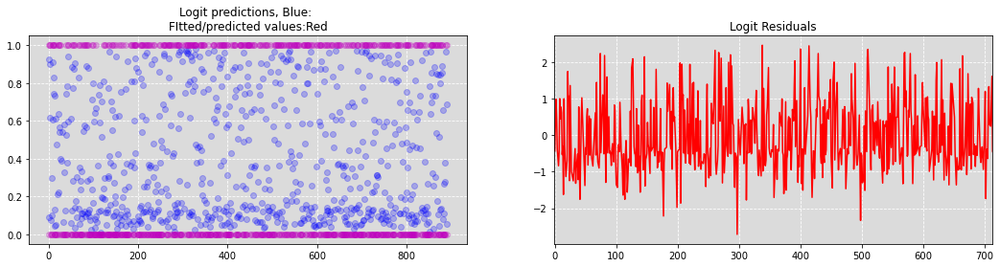

In [65]:
plt.figure(figsize=(18,4));
plt.subplot(121, facecolor="#DBDBDB")

ypred = res.predict(x)
plt.plot(x.index, ypred, 'bo', x.index, y, 'mo', alpha=0.25);
plt.grid(color='white', linestyle='dashed')
plt.title('Logit predictions, Blue: \nFItted/predicted values:Red')


ax2=plt.subplot(122, facecolor="#DBDBDB")
plt.plot(res.resid_dev,'r-')
plt.grid(color='white', linestyle='dashed')
ax2.set_xlim(-1,len(res.resid_dev))
plt.title('Logit Residuals')


In [66]:
fig = plt.figure(figsize=(18,9), dpi=1600)
a=0.2

fig.add_subplot(221, facecolor="#DBDBDB")
kde_res=KDEUnivariate(res.predict())
kde_res.fit()
plt.plot(kde_res.support,kde_res.density)
plt.fill_between(kde_res.support, kde_res.density, alpha=a)
plt.title("Distribution of our Predictions")

fig.add_subplot(222, facecolor = "#DBDBDB")
plt.scatter(res.predict(), x['C(Sex)[T.male]'], alpha=a)
plt.grid(b=True, which= 'major', axis='x')
plt.xlabel("Predicted chance of survival")
plt.ylabel("Gender Bool")
plt.title("The Change of Survival Probability by Gender (1= Male)")

fig.add_subplot(223, facecolor = "#DBDBDB")
plt.scatter(res.predict(), x['C(Pclass)[T.3]'], alpha=a)
plt.xlabel("Predicted chance of survival")
plt.ylabel("Class Bool")
plt.grid(b=True, which= 'major' , axis='x')
plt.title("The change of survival probability by Lower Class (1 = 3rd Class)")


fig.add_subplot(224, facecolor="#DBDBDB")
plt.scatter(res.predict(), x.Age, alpha=a)
plt.grid(True, linewidth=0.15)
plt.title("The CHange of Survival Probability by Age")
plt.xlabel("Predicted chance of survival")
plt.ylabel("Age")


Text(0, 0.5, 'Age')

In [67]:
test_data


,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [68]:
test_data['Survived']=1.23
results


{'Logit': [<statsmodels.discrete.discrete_model.BinaryResultsWrapper at 0x7f362e94bb90>,
  'Survived ~ C(Pclass) + C(Sex) +Age + SibSp + C(Embarked)']}

In [69]:
y_test,x_test= dmatrices(formula, data=test_data, return_type='dataframe')

y_test_pred = res.predict(x_test)

output = pd.DataFrame({'PassengerId': test_data.PassengerId, 'Survived': y_test_pred})


output.to_csv('my2_submission.csv', index=False)
print("ho gaya")

ho gaya


In [74]:
from IPython.display import HTML
import base64
def create_download_link(df, title = "Download CSV file", filename = "data.csv"):  
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)

create_download_link(output)

In [ ]:
#from sklearn.ensemble import RandomForestClassifier

#y = train_data["Survived"]

#features = ["Pclass", "Sex", "SibSp", "Parch"]
#X = pd.get_dummies(train_data[features])
#X_test = pd.get_dummies(test_data[features])

#model = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=1)
#model.fit(X, y)
#predictions = model.predict(X_test)

#output = pd.DataFrame({'PassengerId': test_data.PassengerId, 'Survived': predictions})
#output.to_csv('my_submission.csv', index=False)
#print("Your submission was successfully saved!")

In [77]:
from Kaggleaux import predict as ka


ModuleNotFoundError: No module named 'Kaggleaux'

In [ ]:
pip install -r requirements.txt

In [ ]:
import kaggleaux as ka
